# Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import joblib

# 1. Datos de entrada

## 1.1. Pandoscope

In [9]:
# df_Pda = pd.read_excel(r'S:\RD\RECH\Thèse CIFRE\2022 JRO\0_ML_GPR_LDCP\Full database\Parte_1\PHY_445_VU\Pandoscope\PHY_445_VU_G1279_Total.xlsx')
df_Pda = pd.read_excel(r'C:/Investigación/Jorge-Modelo/Site_1_Pandoscope.xlsx')

In [11]:
df_Pda.head()

,Km,Position,CT,Prof_BS,Prof_BC,Prof_CI,Prof_SS,Pk
0,170.60,O,0.18,-,0.5,1.06,1.33,170600
1,170.80,O,0.18,0.3,0.42,0.62,1.33,170800
2,171.05,O,0.20,0.35,0.66,1.04,1.34,171050
3,171.65,O,0.19,0.26,0.52,-,1.40,171650
4,172.10,O,0.19,-,0.56,-,1.36,172100


In [13]:
df_Pda['Prof_BS'] = pd.to_numeric(df_Pda['Prof_BS'], errors='coerce')
df_Pda['CT'] = pd.to_numeric(df_Pda['CT'], errors='coerce')
df_Pda['Prof_BC'] = pd.to_numeric(df_Pda['Prof_BC'], errors='coerce')

df_Pda['Espesor_BS'] = df_Pda.apply(lambda row: 0 if pd.isna(row['Prof_BS']) else row['Prof_BS'] - row['CT'], axis=1)
df_Pda['Prof_BC_2'] = df_Pda.apply(lambda row: 0 if pd.isna(row['Prof_BC']) else row['Prof_BC'] - row['CT'], axis=1)
df_Pda['Espesor_BC'] = np.where(df_Pda['Prof_BC_2'] == 0, 0, df_Pda['Prof_BC_2'] - df_Pda['Espesor_BS'])

df_Pda['Espesor_BT'] = df_Pda['Espesor_BC']  +  df_Pda['Espesor_BS']
df_Pda['Relacion_Altura'] = 100 * df_Pda['Espesor_BC'] / df_Pda['Espesor_BT']

############################################################################################################################


df_Pda['FI_T_Medium'] = -0.0017*df_Pda['Relacion_Altura']**2 + 0.6311*df_Pda['Relacion_Altura'] + 0.4933


############################################################################################################################

df_Pda['Clasification_Clasica_Medium'] = ''

# Asignar valores a la nueva columna basada en las condiciones
df_Pda.loc[(df_Pda['FI_T_Medium'] >= 0) & (df_Pda['FI_T_Medium'] < 1), 'Clasification_Clasica_Medium'] = 'C'
df_Pda.loc[(df_Pda['FI_T_Medium'] >= 1) & (df_Pda['FI_T_Medium'] < 10), 'Clasification_Clasica_Medium'] = 'MC'
df_Pda.loc[(df_Pda['FI_T_Medium'] >= 10) & (df_Pda['FI_T_Medium'] < 20), 'Clasification_Clasica_Medium'] = 'MF'
df_Pda.loc[(df_Pda['FI_T_Medium'] >= 20) & (df_Pda['FI_T_Medium'] < 40), 'Clasification_Clasica_Medium'] = 'F'
df_Pda.loc[df_Pda['FI_T_Medium'] >= 40, 'Clasification_Clasica_Medium'] = 'HF'


In [15]:
df_Pda['FI_Class'] = ''

# Asignar valores a la nueva columna basada en las condiciones
df_Pda.loc[(df_Pda['FI_T_Medium'] >= 0) & (df_Pda['FI_T_Medium'] < 1), 'FI_Class'] = 0.5
df_Pda.loc[(df_Pda['FI_T_Medium'] >= 1) & (df_Pda['FI_T_Medium'] < 10), 'FI_Class'] = 1.5
df_Pda.loc[(df_Pda['FI_T_Medium'] >= 10) & (df_Pda['FI_T_Medium'] < 20), 'FI_Class'] = 2.5
df_Pda.loc[(df_Pda['FI_T_Medium'] >= 20) & (df_Pda['FI_T_Medium'] < 40), 'FI_Class'] = 3.5
df_Pda.loc[df_Pda['FI_T_Medium'] >= 40, 'FI_Class'] = 4.5

In [17]:
df_Pda['FI_Class'].unique()

array([4.5, 3.5, 2.5, '', 0.5], dtype=object)

## 1.2. GPR

In [20]:
df_GPR_1_2 = pd.read_csv(r'C:/Investigación/Jorge-Modelo/Site_1.csv')

In [22]:
df_GPR_1_2

,Pk,mean,rms,ecart_type,median,skew,kurtosis,q1,q2,q3,...,AH_6_0,AH_6_1,AH_6_2,AH_6_3,AH_6_4,AH_6_5,AH_6_6,AH_6_7,AH_6_8,AH_6_9
0,170374,0.020700,0.000428,0.281943,0.008123,0.530921,2.648006,-0.087792,0.008123,0.113655,...,0.007203,0.006515,0.005817,0.005194,0.004504,0.003864,0.003211,0.002644,0.002276,0.002169
1,170375,0.019496,0.000380,0.314552,0.015473,0.330205,1.878795,-0.109514,0.015473,0.116509,...,0.013910,0.013724,0.013618,0.013655,0.013651,0.013711,0.013685,0.013652,0.013546,0.013382
2,170376,0.025307,0.000640,0.335246,0.018629,0.121390,1.348083,-0.118411,0.018629,0.166701,...,0.016361,0.014673,0.012973,0.011277,0.009618,0.008069,0.006773,0.005971,0.005937,0.006722
3,170377,-0.005477,0.000030,0.409803,0.011515,-0.146467,0.921400,-0.170518,0.011515,0.128468,...,0.017009,0.016510,0.015984,0.015453,0.014956,0.014527,0.014196,0.013999,0.013949,0.014063
4,170378,0.008662,0.000075,0.304232,0.001305,0.229152,1.280761,-0.170331,0.001305,0.140048,...,0.023986,0.023213,0.022358,0.021429,0.020436,0.019348,0.018212,0.016973,0.015703,0.014345
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28864,199238,-0.004433,0.000020,0.338333,-0.025231,0.089991,0.717239,-0.205878,-0.025231,0.188151,...,0.015806,0.014112,0.012624,0.011307,0.010356,0.009713,0.009536,0.009754,0.010340,0.011241
28865,199239,-0.004151,0.000017,0.338635,-0.023272,0.081861,0.724769,-0.202562,-0.023272,0.192276,...,0.016018,0.014266,0.012715,0.011335,0.010323,0.009632,0.009428,0.009640,0.010240,0.011169
28866,199240,-0.004289,0.000018,0.338783,-0.024426,0.087892,0.698891,-0.207300,-0.024426,0.193100,...,0.015865,0.014132,0.012596,0.011231,0.010231,0.009546,0.009344,0.009555,0.010150,0.011071
28867,199241,-0.004477,0.000020,0.339374,-0.024328,0.089522,0.673491,-0.206204,-0.024328,0.192927,...,0.015830,0.014096,0.012558,0.011188,0.010185,0.009501,0.009306,0.009531,0.010143,0.011086


In [24]:
features = [
    # _______________________________________________________40 PARAMETROS_________________________________________________________________________ #
 'mean', 'rms', 'ecart_type', 'median', 'skew', 'kurtosis', 'q1', 'q2', 'q3', 'd1', 'd2', 'd3', 'd4', 'd6', 'd7', 'd8', 'd9', 'peak_max', 'peak_min', 'crest',
 'mean_hilbert', 'rms_hilbert', 'std_hilbert',  'median_hilbert', 'skew_hilbert', 'kurtosis_hilbert', 'q1_hilbert', 'q2_hilbert', 'q3_hilbert',
 'd1_hilbert', 'd2_hilbert', 'd3_hilbert', 'd4_hilbert', 'd6_hilbert', 'd7_hilbert', 'd8_hilbert', 'd9_hilbert', 'peak_max_hilbert', 'peak_min_hilbert', 'crest_hilbert',

    # _______________________________________________________6 PARAMETROS_________________________________________________________________________ #
 'number_zeros',  'area_signal', 'points_inflexion', 'area_fourier', 'area_hilbert', 'fourier_peak_max',

    # _______________________________________________________70 PARAMETROS_________________________________________________________________________ #

 'stat_slice_0_mean', 'stat_slice_1_mean', 'stat_slice_2_mean', 'stat_slice_3_mean', 'stat_slice_4_mean', 'stat_slice_5_mean', 'stat_slice_6_mean', 'stat_slice_7_mean',
 'stat_slice_8_mean', 'stat_slice_9_mean', 'stat_slice_10_mean', 'stat_slice_11_mean', 'stat_slice_12_mean', 'stat_slice_13_mean',

 'stat_slice_0_std', 'stat_slice_1_std', 'stat_slice_2_std', 'stat_slice_3_std', 'stat_slice_4_std', 'stat_slice_5_std', 'stat_slice_6_std', 'stat_slice_7_std',
 'stat_slice_8_std', 'stat_slice_9_std', 'stat_slice_10_std', 'stat_slice_11_std', 'stat_slice_12_std', 'stat_slice_13_std',

    # _______________________________________________________66 PARAMETROS_________________________________________________________________________ #

'ST_0_0', 'ST_0_1', 'ST_0_2', 'ST_0_4', 'ST_0_5', 'ST_0_8', 'ST_0_9', # 7
 'ST_1_0', 'ST_1_1', 'ST_1_2', 'ST_1_3', 'ST_1_4', 'ST_1_5', 'ST_1_6', 'ST_1_8', 'ST_1_9', # 9
 'ST_2_0', 'ST_2_1', 'ST_2_2', 'ST_2_3', 'ST_2_4', 'ST_2_5', 'ST_2_6', 'ST_2_7', 'ST_2_8', 'ST_2_9', # 10
 'ST_3_0', 'ST_3_1', 'ST_3_2', 'ST_3_3', 'ST_3_4', 'ST_3_5', 'ST_3_6', 'ST_3_7', 'ST_3_8', 'ST_3_9', # 10
 'ST_4_0', 'ST_4_1', 'ST_4_2', 'ST_4_3', 'ST_4_4', 'ST_4_5', 'ST_4_6', 'ST_4_7', 'ST_4_8', 'ST_4_9', # 10
 'ST_5_0', 'ST_5_1', 'ST_5_2', 'ST_5_3', 'ST_5_4', 'ST_5_5', 'ST_5_6', 'ST_5_7', 'ST_5_8', 'ST_5_9', # 10
 'ST_6_0', 'ST_6_1', 'ST_6_2', 'ST_6_3', 'ST_6_4', 'ST_6_5', 'ST_6_6', 'ST_6_7', 'ST_6_8', 'ST_6_9', # 10

    # _______________________________________________________66 PARAMETROS_________________________________________________________________________ #

 'H_0_0', 'H_0_1', 'H_0_2', 'H_0_4', 'H_0_5', 'H_0_8', 'H_0_9',
 'H_1_0', 'H_1_1', 'H_1_2', 'H_1_3', 'H_1_4', 'H_1_5', 'H_1_6', 'H_1_8', 'H_1_9',
 'H_2_0', 'H_2_1', 'H_2_2', 'H_2_3', 'H_2_4', 'H_2_5', 'H_2_6', 'H_2_7', 'H_2_8', 'H_2_9',
 'H_3_0', 'H_3_1', 'H_3_2', 'H_3_3', 'H_3_4', 'H_3_5', 'H_3_6', 'H_3_7', 'H_3_8', 'H_3_9',
 'H_4_0', 'H_4_1', 'H_4_2', 'H_4_3', 'H_4_4', 'H_4_5', 'H_4_6', 'H_4_7', 'H_4_8', 'H_4_9',
 'H_5_0', 'H_5_1', 'H_5_2', 'H_5_3', 'H_5_4', 'H_5_5', 'H_5_6', 'H_5_7', 'H_5_8', 'H_5_9',

    # _______________________________________________________66 PARAMETROS_________________________________________________________________________ #

 'AH_0_0', 'AH_0_1', 'AH_0_2', 'AH_0_4', 'AH_0_5', 'AH_0_8', 'AH_0_9',
 'AH_1_0', 'AH_1_1', 'AH_1_2', 'AH_1_3', 'AH_1_4', 'AH_1_5', 'AH_1_6', 'AH_1_8', 'AH_1_9',
 'AH_2_0', 'AH_2_1', 'AH_2_2', 'AH_2_3', 'AH_2_4', 'AH_2_5', 'AH_2_6', 'AH_2_7', 'AH_2_8', 'AH_2_9',
 'AH_3_0', 'AH_3_1', 'AH_3_2', 'AH_3_3', 'AH_3_4', 'AH_3_5', 'AH_3_6', 'AH_3_7', 'AH_3_8', 'AH_3_9',
 'AH_4_0', 'AH_4_1', 'AH_4_2', 'AH_4_3', 'AH_4_4', 'AH_4_5', 'AH_4_6', 'AH_4_7', 'AH_4_8', 'AH_4_9',
 'AH_5_0', 'AH_5_1', 'AH_5_2', 'AH_5_3', 'AH_5_4', 'AH_5_5', 'AH_5_6', 'AH_5_7', 'AH_5_8', 'AH_5_9',
 'AH_6_0', 'AH_6_1', 'AH_6_2', 'AH_6_3', 'AH_6_4', 'AH_6_5', 'AH_6_6', 'AH_6_7', 'AH_6_8', 'AH_6_9',
]

# 2. Cargar modelo

In [ ]:
import xgboost as xgb
# 7. Cargar el modelo guardado
loaded_model = xgb.XGBClassifier()
loaded_model.load_model("D:/Investigación/Investigacion-Jorge/OptAccuracy/mejor_modelo_xgb-Accuracy.json")



In [33]:

# Cargar el modelo XGBoost previamente guardado
loaded_model = joblib.load("C:/Investigación/Jorge-Modelo/best_xgb_model-accuracy-xgboost.pkl")

# (Opcional) Cargar el LabelEncoder si lo usaste en el preprocesamiento
label_encoder = joblib.load("C:/Investigación/Jorge-Modelo/label_encoderaccuracy-xgboost.pkl")

# Usar el modelo para predecir (por ejemplo, X_new debe estar preparado igual que en entrenamiento)
# y_pred = model.predict(X_new)


# 3. Aplicacion Modelo

## 3.1. Aplicacion del Modelo

In [ ]:
#mapeo_etiquetas = {0: 'C', 1: 'F', 2: 'HF', 3: 'MC', 4: 'MF'}

X = df_GPR_1_2[features]

# Realiza las predicciones para cada fila en X
predicciones = loaded_model.predict(X)

# Crea el DataFrame df_Resultados con las predicciones
df_Resultados = pd.DataFrame(predicciones, columns=['Prediccion'])

# (Opcional) Obtén las probabilidades de cada clase si es un modelo de clasificación
if hasattr(loaded_model, "predict_proba"):
    probabilidades = loaded_model.predict_proba(X)

    # Usa el diccionario para renombrar las columnas con nombres de clase
    df_probabilidades = pd.DataFrame(probabilidades, columns=[f'Probabilidad_{mapeo_etiquetas[i]}' for i in range(probabilidades.shape[1])])

    # Concatenamos las probabilidades al DataFrame df_Resultados
    df_Resultados = pd.concat([df_Resultados, df_probabilidades], axis=1)


In [35]:
# ✅ Datos a predecir
X = df_GPR_1_2[features]

# 🔍 Predicciones codificadas
pred_codificadas = loaded_model.predict(X)

# 🔁 Decodifica las predicciones a etiquetas originales
pred_labels = label_encoder.inverse_transform(pred_codificadas)

# 📄 Construye el DataFrame con resultados
df_Resultados = pd.DataFrame(pred_labels, columns=['Prediccion'])

# 🔢 Opcional: Probabilidades por clase
if hasattr(loaded_model, "predict_proba"):
    probabilidades = loaded_model.predict_proba(X)
    # Renombra las columnas usando el LabelEncoder
    clases = label_encoder.classes_
    df_probabilidades = pd.DataFrame(probabilidades, columns=[f'Probabilidad_{clase}' for clase in clases])
    # Concatena todo
    df_Resultados = pd.concat([df_Resultados, df_probabilidades], axis=1)

# ✅ df_Resultados ahora contiene etiquetas originales y probabilidades


In [37]:
df_Resultados.head()

,Prediccion,Probabilidad_C,Probabilidad_F,Probabilidad_HF,Probabilidad_MC,Probabilidad_MF
0,MF,0.036626,0.173952,0.015988,0.310948,0.462486
1,MF,0.032208,0.031891,0.006542,0.245327,0.684031
2,MF,0.026987,0.119374,0.106144,0.256343,0.491152
3,MF,0.019707,0.005926,0.001600,0.437268,0.535499
4,MF,0.298961,0.066170,0.003322,0.124002,0.507545


In [39]:
df_Resultados['Prediccion'].unique()

array(['MF', 'MC', 'F', 'HF', 'C'], dtype=object)

In [41]:
df_Resultados['Pk'] = df_GPR_1_2['Pk'].values

In [43]:
#df_Resultados['Prediccion'] = df_Resultados['Prediccion'].map(mapeo_etiquetas)


NameError: name 'mapeo_etiquetas' is not defined

In [45]:
mapeo_predicciones = {
    'C': 0.5,
    'MC': 1.5,
    'MF': 2.5,
    'F': 3.5,
    'HF': 4.5
}

# Crear la nueva columna basada en el mapeo
df_Resultados['Prediccion_Numero'] = df_Resultados['Prediccion'].map(mapeo_predicciones)

In [47]:
conteo_predicciones = df_Resultados['Prediccion_Numero'].value_counts()
conteo_predicciones

Prediccion_Numero
2.5    17871
1.5     4799
3.5     3280
4.5     2724
0.5      195
Name: count, dtype: int64

In [49]:
df_Resultados.head()

,Prediccion,Probabilidad_C,Probabilidad_F,Probabilidad_HF,Probabilidad_MC,Probabilidad_MF,Pk,Prediccion_Numero
0,MF,0.036626,0.173952,0.015988,0.310948,0.462486,170374,2.5
1,MF,0.032208,0.031891,0.006542,0.245327,0.684031,170375,2.5
2,MF,0.026987,0.119374,0.106144,0.256343,0.491152,170376,2.5
3,MF,0.019707,0.005926,0.001600,0.437268,0.535499,170377,2.5
4,MF,0.298961,0.066170,0.003322,0.124002,0.507545,170378,2.5


## 3.2. Regularizacion de resultados

In [52]:
def regularizar_bloques(series, tamaño_bloque=5):
    resultados = []

    for i in range(0, len(series), tamaño_bloque):
        bloque = series[i:i + tamaño_bloque]
        conteo = bloque.value_counts()

        # Obtener el valor más frecuente
        valor_mas_frecuente = conteo.idxmax()
        max_frecuencia = conteo.max()

        # Verificar si hay un empate
        if (conteo == max_frecuencia).sum() > 1:
            # En caso de empate, conservar el mayor valor
            valor_conservado = conteo[conteo == max_frecuencia].idxmax()
        else:
            valor_conservado = valor_mas_frecuente

        # Repetir el valor conservado en el bloque correspondiente
        resultados.extend([valor_conservado] * len(bloque))

    return pd.Series(resultados)

# Aplicar la función y crear la nueva columna
df_Resultados['Prediccion_Num_reg_5'] = regularizar_bloques(df_Resultados['Prediccion_Numero'])

In [54]:
def regularizar_bloques(series, tamaño_bloque=20):
    resultados = []

    for i in range(0, len(series), tamaño_bloque):
        bloque = series[i:i + tamaño_bloque]
        conteo = bloque.value_counts()

        # Obtener el valor más frecuente
        valor_mas_frecuente = conteo.idxmax()
        max_frecuencia = conteo.max()

        # Verificar si hay un empate
        if (conteo == max_frecuencia).sum() > 1:
            # En caso de empate, conservar el mayor valor
            valor_conservado = conteo[conteo == max_frecuencia].idxmax()
        else:
            valor_conservado = valor_mas_frecuente

        # Repetir el valor conservado en el bloque correspondiente
        resultados.extend([valor_conservado] * len(bloque))

    return pd.Series(resultados)

# Aplicar la función y crear la nueva columna
df_Resultados['Prediccion_Num_reg_20'] = regularizar_bloques(df_Resultados['Prediccion_Numero'])

In [56]:
df_Pda

,Km,Position,CT,Prof_BS,Prof_BC,Prof_CI,Prof_SS,Pk,Espesor_BS,Prof_BC_2,Espesor_BC,Espesor_BT,Relacion_Altura,FI_T_Medium,Clasification_Clasica_Medium,FI_Class
0,170.60,O,0.18,NaN,0.50,1.06,1.33,170600,0.00,0.32,0.32,0.32,100.000000,46.603300,HF,4.5
1,170.80,O,0.18,0.30,0.42,0.62,1.33,170800,0.12,0.24,0.12,0.24,50.000000,27.798300,F,3.5
2,171.05,O,0.20,0.35,0.66,1.04,1.34,171050,0.15,0.46,0.31,0.46,67.391304,35.303253,F,3.5
3,171.65,O,0.19,0.26,0.52,-,1.40,171650,0.07,0.33,0.26,0.33,78.787879,39.663530,F,3.5
4,172.10,O,0.19,NaN,0.56,-,1.36,172100,0.00,0.37,0.37,0.37,100.000000,46.603300,HF,4.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,197.80,O,0.22,NaN,0.40,0.94,1.35,197800,0.00,0.18,0.18,0.18,100.000000,46.603300,HF,4.5
66,198.30,O,0.20,0.44,0.60,0.71,1.31,198300,0.24,0.40,0.16,0.40,40.000000,23.017300,F,3.5
67,198.70,De,0.19,NaN,0.35,0.82,1.43,198700,0.00,0.16,0.16,0.16,100.000000,46.603300,HF,4.5
68,198.90,De,0.21,0.47,0.57,0.8,1.35,198900,0.26,0.36,0.10,0.36,27.777778,16.712127,MF,2.5


ValueError: could not convert string to float: ''

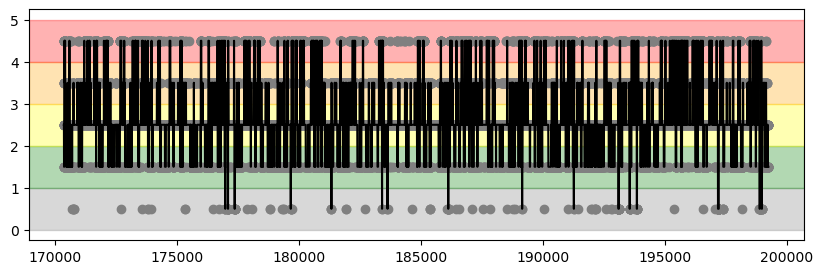

In [58]:
# Crear el scatter plot
plt.figure(figsize=(10, 3))

# Agregar bandas de color en el fondo del gráfico
plt.axhspan(0, 1, color='gray', alpha=0.3, label='Clean')  # Banda verde
plt.axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')  # Banda verde
plt.axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')  # Banda amarilla
plt.axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')  # Banda naranja
plt.axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')  # Banda roja

# Trazar el scatter plot Prediccion_Num_reg_10
plt.plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_5'], color='black', label = 'Estimation by ML(GPR)')
plt.scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'], color='gray', label = 'Estimation by ML(GPR)')
plt.scatter(df_Pda['Pk'], df_Pda['FI_Class'], color='blue', label = 'Estimation by Pandoscope')

# plt.bar(df_pda_application['pk'], df_pda_application['Fouling_Index_Clasificacion'], color='blue', alpha=0.7, width=5, label = 'Estimation by Pandoscope')

# Etiquetas y título
plt.xlabel('Length (m)')
plt.ylabel('Category')  # Cambié 'Cas' a 'Categoría' para mayor claridad
plt.title('Fouling state prediction using the Random Forest model')
plt.xlim(421000, 422000)
plt.ylim(0, 4.5)

# Cambiar etiquetas en el eje Y a nombres específicos
etiquetas_y = ['Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
num_categorias = len(etiquetas_y)  # Usar la longitud de la lista de etiquetas

plt.yticks(range(1, num_categorias + 1), etiquetas_y)  # Asignar las etiquetas personalizadas

plt.grid(True, alpha=0.3, linestyle='--')

# Añadir la leyenda
plt.legend(loc = 'upper left')

# Mostrar el gráfico
plt.show()

ValueError: could not convert string to float: ''

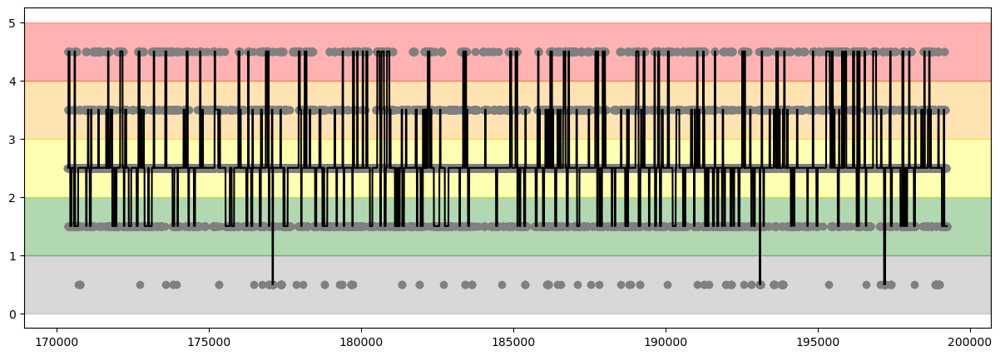

In [60]:
plt.figure(figsize=(15, 5))

# Agregar bandas de color en el fondo del gráfico
plt.axhspan(0, 1, color='gray', alpha=0.3, label='Clean')  # Banda gris
plt.axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')  # Banda verde
plt.axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')  # Banda amarilla
plt.axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')  # Banda naranja
plt.axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')  # Banda roja

# Trazar el scatter plot Prediccion_Num_reg_10
# plt.plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_5'], color='black', label = 'Estimation by ML(GPR)')
plt.plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'], color='black', label = 'Regularization per 20 meters (ML)')

plt.scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'], color='gray', label = 'Estimation by ML(GPR)')

plt.scatter(df_Pda['Pk'], df_Pda['FI_Class'], color='blue', label = 'Estimation by Pandoscope')

# Etiquetas y título
plt.xlabel('Length (m)')
plt.ylabel('Category')  # Cambié 'Cas' a 'Categoría' para mayor claridad
plt.title('Fouling state prediction using the Random Forest model')

xlim_1 = 420000
xlim_2 = 424000
plt.xlim(xlim_1, xlim_2)
plt.ylim(0, 5)

# Cambiar etiquetas en el eje Y a nombres específicos
etiquetas_y = ['Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
num_categorias = len(etiquetas_y)  # Usar la longitud de la lista de etiquetas

# Colocar etiquetas del eje Y en la parte inferior
plt.yticks(range(1, num_categorias + 1), etiquetas_y)  # Asignar las etiquetas personalizadas

# Cambiar la posición de las etiquetas del eje Y
plt.gca().tick_params(axis='y', labelsize=10, pad=15)  # Mueve las etiquetas hacia abajo

plt.grid(True, alpha=0.3, linestyle='--')

# Añadir la leyenda
plt.legend(loc='upper left')

# Mostrar el gráfico
plt.show()

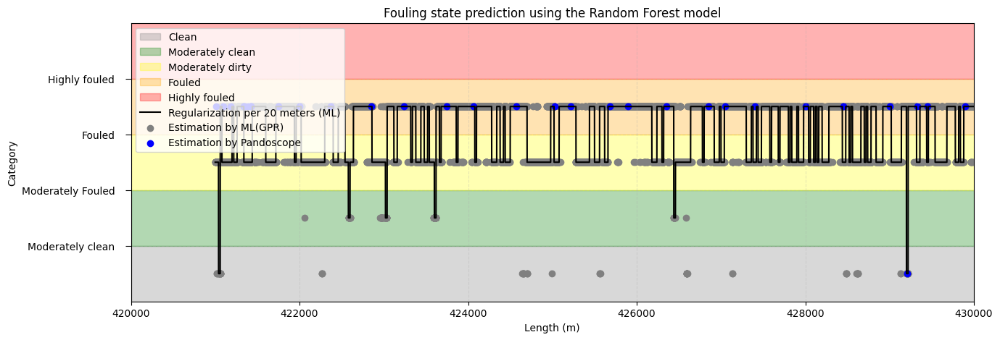

In [ ]:

plt.figure(figsize=(15, 5))

# Agregar bandas de color en el fondo del gráfico
plt.axhspan(0, 1, color='gray', alpha=0.3, label='Clean')  # Banda gris
plt.axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')  # Banda verde
plt.axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')  # Banda amarilla
plt.axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')  # Banda naranja
plt.axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')  # Banda roja

# Trazar el scatter plot Prediccion_Num_reg_10
# plt.plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_5'], color='black', label = 'Estimation by ML(GPR)')
plt.plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'], color='black', label = 'Regularization per 20 meters (ML)')

plt.scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'], color='gray', label = 'Estimation by ML(GPR)')

plt.scatter(df_Pda['Pk'], df_Pda['FI_Class'], color='blue', label = 'Estimation by Pandoscope')

# Etiquetas y título
plt.xlabel('Length (m)')
plt.ylabel('Category')  # Cambié 'Cas' a 'Categoría' para mayor claridad
plt.title('Fouling state prediction using the Random Forest model')

xlim_1 = 420000
xlim_2 = 430000
plt.xlim(xlim_1, xlim_2)
plt.ylim(0, 5)

# Cambiar etiquetas en el eje Y a nombres específicos
etiquetas_y = ['Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
num_categorias = len(etiquetas_y)  # Usar la longitud de la lista de etiquetas

# Colocar etiquetas del eje Y en la parte inferior
plt.yticks(range(1, num_categorias + 1), etiquetas_y)  # Asignar las etiquetas personalizadas

# Mover las etiquetas fuera del gráfico (en la parte inferior)
plt.gca().tick_params(axis='y', labelsize=10, direction='out', length=6, pad=10)

plt.grid(True, alpha=0.3, linestyle='--')

# Añadir la leyenda
plt.legend(loc='upper left')

# Mostrar el gráfico
plt.show()

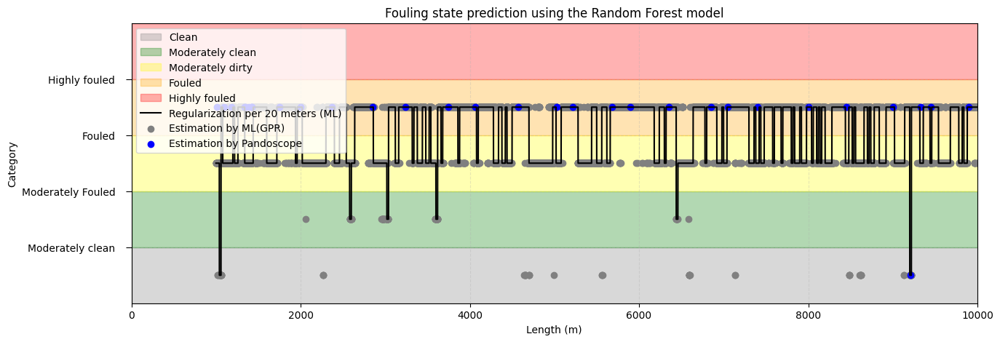

In [ ]:
plt.figure(figsize=(15, 5))

# Agregar bandas de color en el fondo del gráfico
plt.axhspan(0, 1, color='gray', alpha=0.3, label='Clean')  # Banda gris
plt.axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')  # Banda verde
plt.axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')  # Banda amarilla
plt.axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')  # Banda naranja
plt.axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')  # Banda roja

# Trazar el scatter plot Prediccion_Num_reg_10
# plt.plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_5'], color='black', label = 'Estimation by ML(GPR)')
plt.plot(df_Resultados['Pk']-420000, df_Resultados['Prediccion_Num_reg_20'], color='black', label = 'Regularization per 20 meters (ML)')

plt.scatter(df_Resultados['Pk']-420000, df_Resultados['Prediccion_Numero'], color='gray', label = 'Estimation by ML(GPR)')

plt.scatter(df_Pda['Pk']-420000, df_Pda['FI_Class'], color='blue', label = 'Estimation by Pandoscope')

# Etiquetas y título
plt.xlabel('Length (m)')
plt.ylabel('Category')  # Cambié 'Cas' a 'Categoría' para mayor claridad
plt.title('Fouling state prediction using the Random Forest model')

xlim_1 = 0
xlim_2 = 10000
plt.xlim(xlim_1, xlim_2)
plt.ylim(0, 5)

# Cambiar etiquetas en el eje Y a nombres específicos
etiquetas_y = ['Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
num_categorias = len(etiquetas_y)  # Usar la longitud de la lista de etiquetas

# Colocar etiquetas del eje Y en la parte inferior
plt.yticks(range(1, num_categorias + 1), etiquetas_y)  # Asignar las etiquetas personalizadas

# Mover las etiquetas fuera del gráfico (en la parte inferior)
plt.gca().tick_params(axis='y', labelsize=10, direction='out', length=6, pad=10)

plt.grid(True, alpha=0.3, linestyle='--')

# Añadir la leyenda
plt.legend(loc='upper left')

# Mostrar el gráfico
plt.show()

# 4. Radargrama

In [ ]:
df_H = pd.read_csv(r'D:\ML_GPR_BDD\Full Database\Parte_1\PHY_444_VU\GPR_Signal\AXE\AXE_PHY_444_L611000_VU_PKD421_000_PKF499_246_Hilbert.csv')

In [ ]:
# df_H.drop(df_H[df_H['Pk'] > 430000].index, inplace=True)

In [ ]:
df_H = df_H.pivot(index='Time', columns='Pk', values='Hilbert')

df_H.sort_index(axis=0, inplace=True)
df_H.sort_index(axis=1, inplace=True)

In [ ]:
df_ST = pd.read_csv(r'D:\ML_GPR_BDD\Full Database\Parte_1\PHY_444_VU\GPR_Signal\AXE\AXE_PHY_444_L611000_VU_PKD421_000_PKF499_246_Signaux_traitees.csv')

In [ ]:
# df_ST.drop(df_ST[df_ST['Pk'] > 430000].index, inplace=True)

In [ ]:
df_ST = df_ST.pivot(index='Time', columns='Pk', values='GPR')

df_ST.sort_index(axis=0, inplace=True)
df_ST.sort_index(axis=1, inplace=True)

In [ ]:
df_ST

Pk,421000,421001,421002,421003,421004,421005,421006,421007,421008,421009,...,499236,499237,499238,499239,499240,499241,499242,499243,499244,499245
Time,,,,,,,,,,,,,,,,,,,,,
55.0,0.010957,-0.003110,-0.002643,0.011162,0.000967,-0.004096,0.011345,-0.010203,0.008738,-0.001793,...,0.030038,-0.003128,0.012782,0.055231,0.038621,-0.051281,-0.049365,-0.044119,-0.034050,-0.033064
56.0,0.022258,0.006126,0.008889,0.025625,0.012300,0.008225,0.026416,-0.000076,0.021447,0.011250,...,0.009475,-0.021096,0.008275,0.049873,0.022565,-0.024826,-0.024509,-0.049058,-0.040406,-0.020815
57.0,0.028930,0.012641,0.017183,0.034619,0.019886,0.017476,0.036079,0.008176,0.029483,0.020860,...,-0.008791,-0.033010,0.004364,0.041482,0.007983,0.001055,-0.003308,-0.050309,-0.043341,-0.008931
58.0,0.030403,0.015814,0.021297,0.037337,0.022938,0.022682,0.039397,0.013561,0.032051,0.025994,...,-0.022734,-0.037589,0.001872,0.031039,-0.003581,0.023121,0.011850,-0.047013,-0.041900,0.001211
59.0,0.026999,0.015652,0.021083,0.034122,0.021547,0.023647,0.036537,0.015655,0.029326,0.026451,...,-0.031351,-0.034959,0.001183,0.019569,-0.011443,0.039415,0.020414,-0.038776,-0.035627,0.008936
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300.0,0.001027,0.001549,0.002059,0.000501,0.000813,0.001060,0.001000,0.001858,0.001381,0.001278,...,-0.002277,-0.009351,-0.004963,-0.003377,-0.000575,-0.002311,-0.002014,0.001105,-0.000183,0.000298
301.0,0.000819,0.001464,0.001902,0.000132,0.000556,0.000932,0.000718,0.001627,0.001236,0.000997,...,-0.002657,-0.009868,-0.005745,-0.003330,-0.000264,-0.003276,-0.002298,0.000416,-0.000433,0.000914
302.0,0.000590,0.001368,0.001687,-0.000213,0.000293,0.000780,0.000450,0.001365,0.001056,0.000689,...,-0.003085,-0.009988,-0.006318,-0.003141,-0.000091,-0.004075,-0.002373,-0.000210,-0.000627,0.001507


Text(0, 0.5, 'Samples')

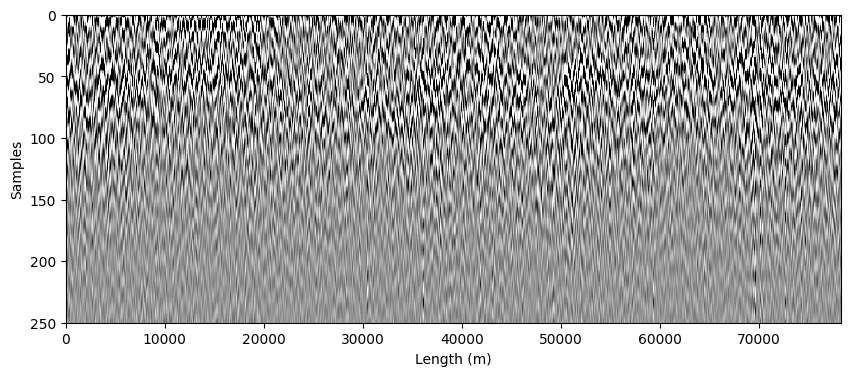

In [ ]:
v_min = np.percentile(df_ST, 5)
v_max = np.percentile(df_ST, 95)

fig, ax = plt.subplots(1, 1, figsize = (10, 4))
ax.pcolormesh(df_ST, cmap='Greys_r', vmin = v_min, vmax = v_max)
ax.invert_yaxis()
ax.set_xlabel("Length (m)")
ax.set_ylabel("Samples")

Text(0, 0.5, 'Samples')

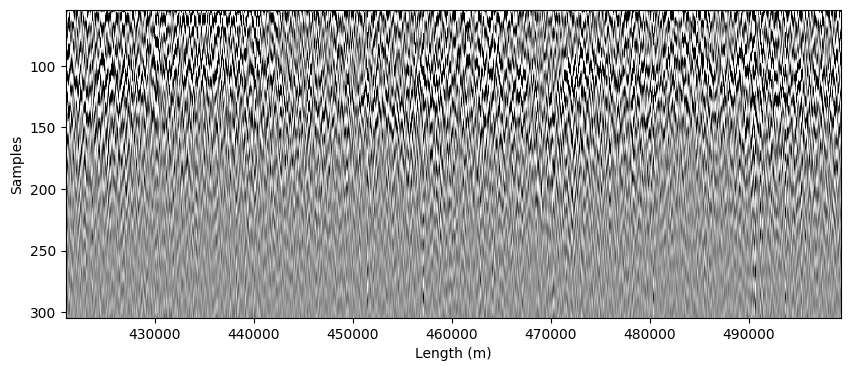

In [ ]:
v_min = np.percentile(df_ST, 5)
v_max = np.percentile(df_ST, 95)

fig, ax = plt.subplots(1, 1, figsize = (10, 4))
ax.pcolormesh(df_ST.columns, df_ST.index, df_ST, cmap='Greys_r', vmin = v_min, vmax = v_max)
ax.invert_yaxis()
ax.set_xlabel("Length (m)")
ax.set_ylabel("Samples")

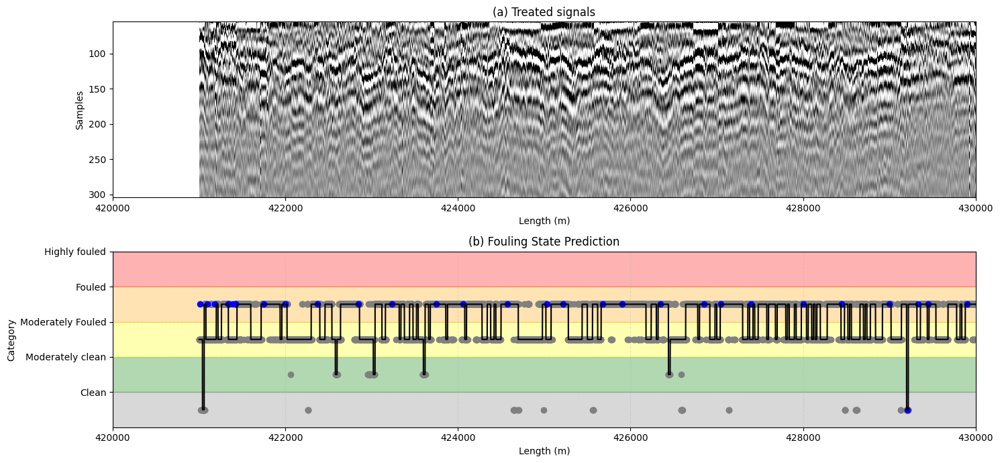

In [ ]:
# Configuración inicial
v_min = np.percentile(df_ST.values, 5)
v_max = np.percentile(df_ST.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 420000
xlim_2 = 430000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_ST.columns, df_ST.index, df_ST, cmap='Greys_r', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Treated signals")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

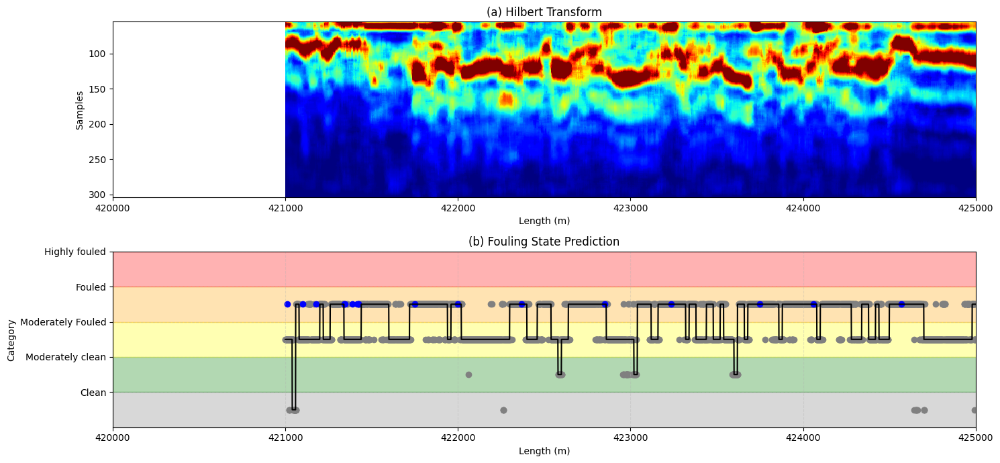

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 420000
xlim_2 = 425000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

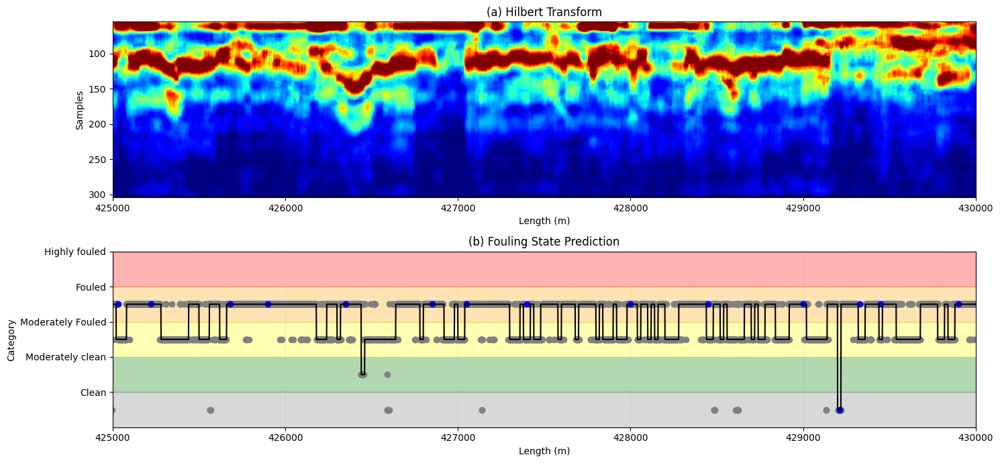

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 425000
xlim_2 = 430000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

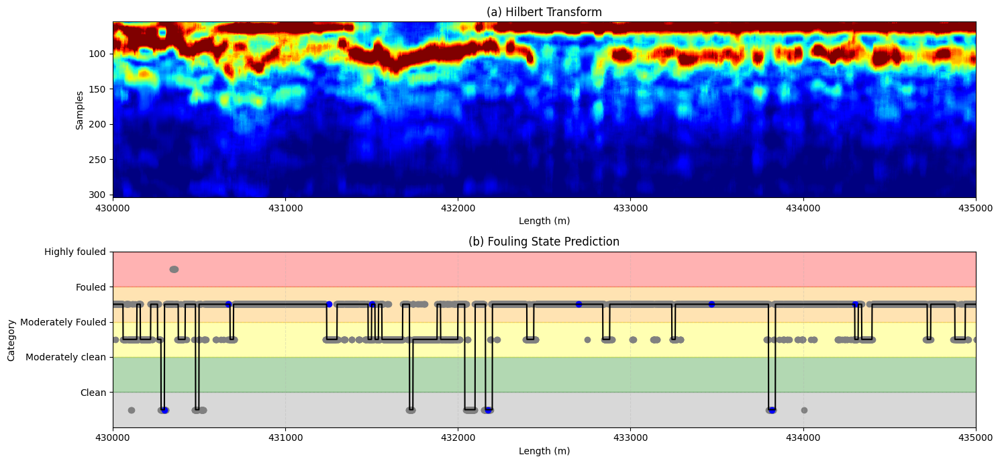

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 430000
xlim_2 = 435000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

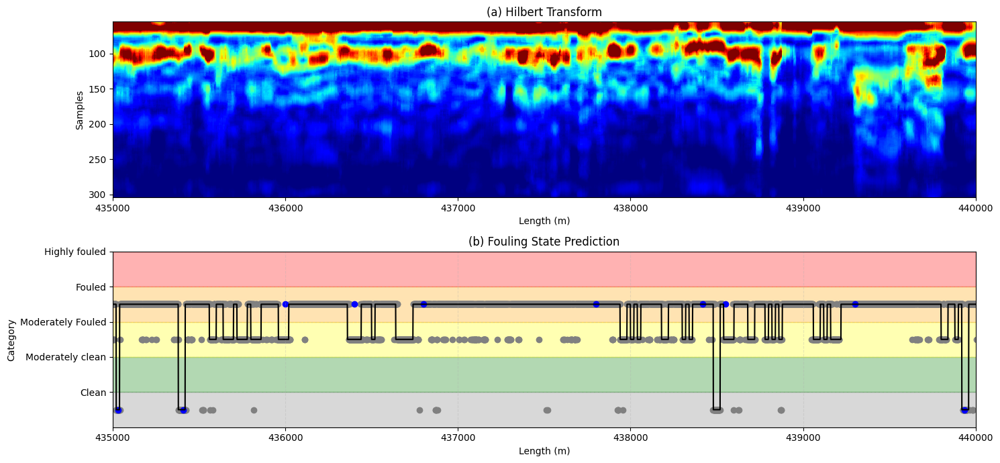

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 435000
xlim_2 = 440000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

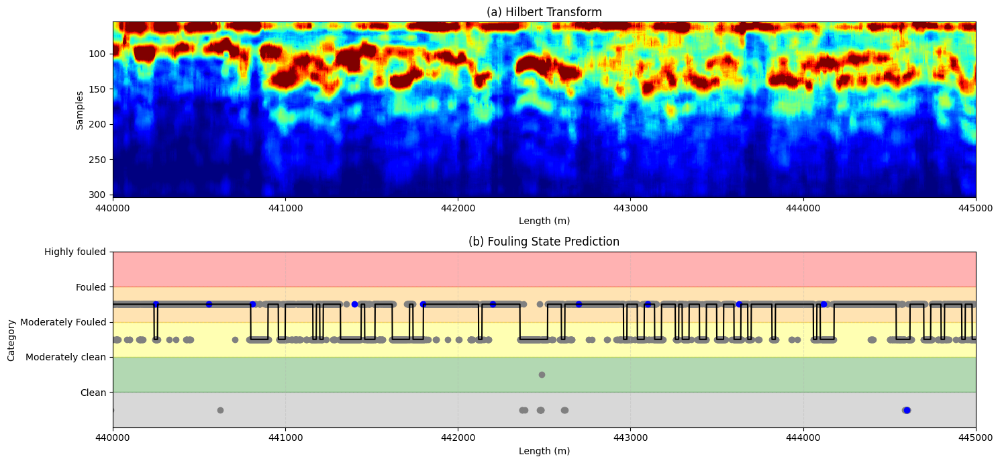

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 440000
xlim_2 = 445000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

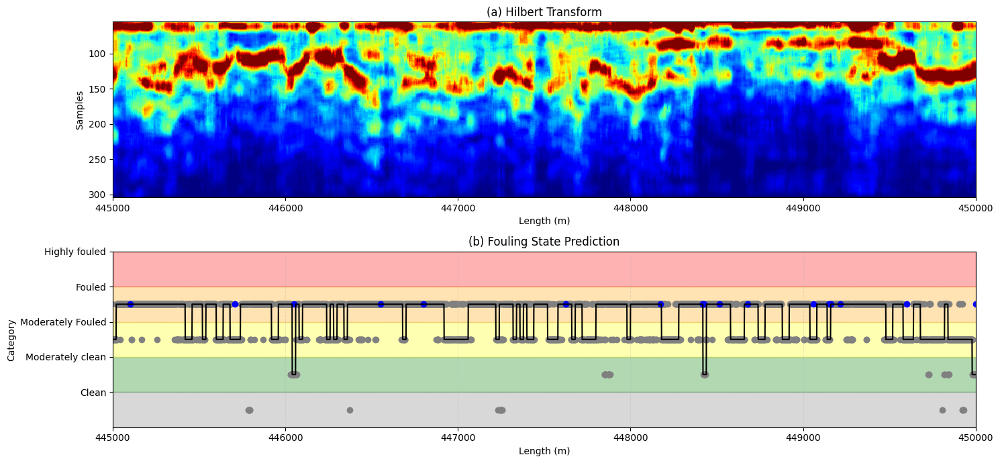

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 445000
xlim_2 = 450000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

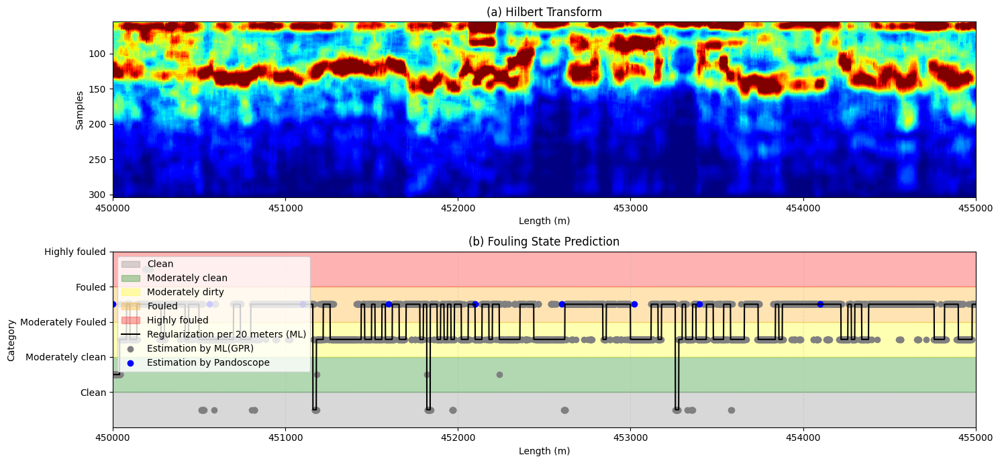

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 450000
xlim_2 = 455000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

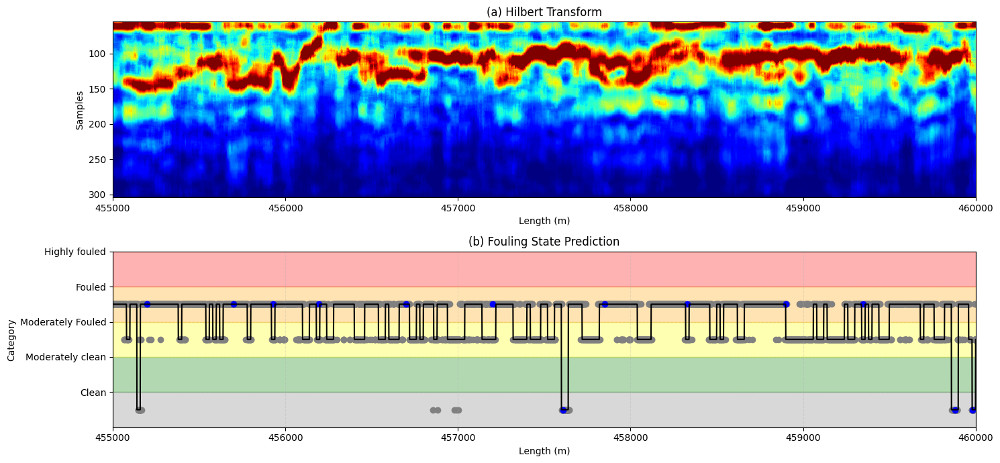

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 455000
xlim_2 = 460000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

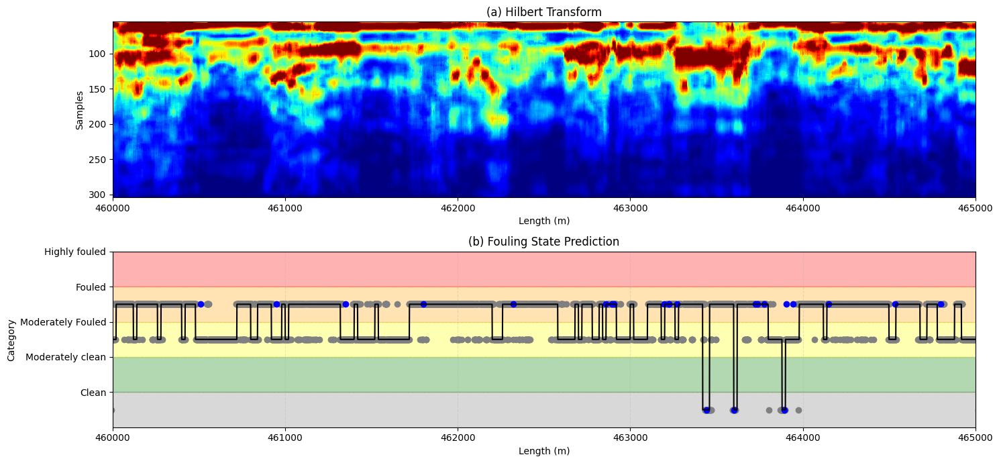

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 460000
xlim_2 = 465000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

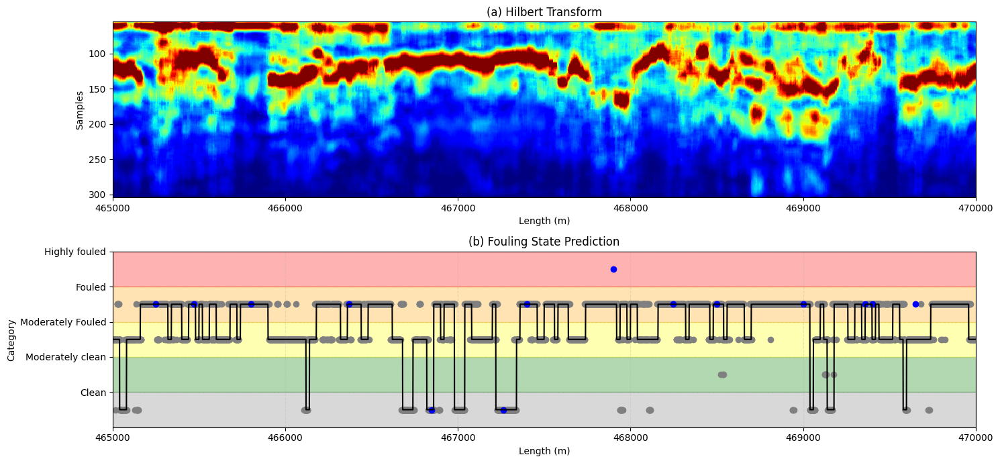

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 465000
xlim_2 = 470000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

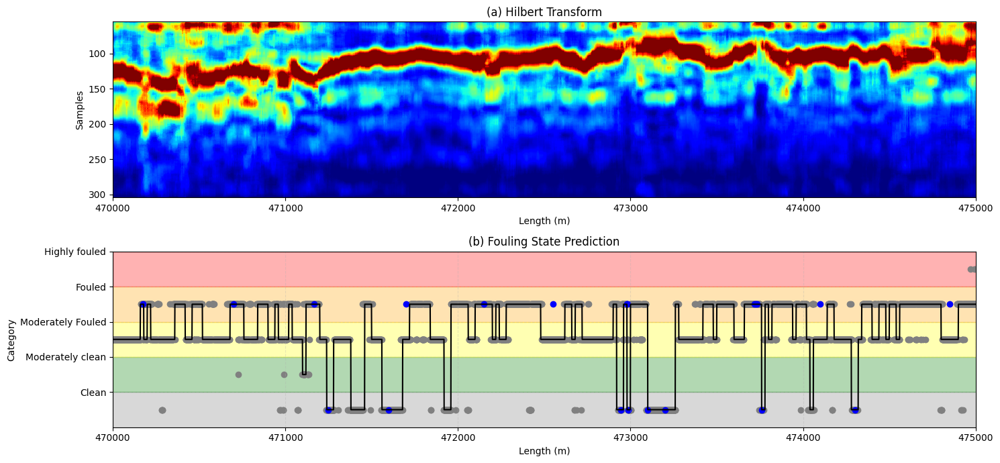

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 470000
xlim_2 = 475000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

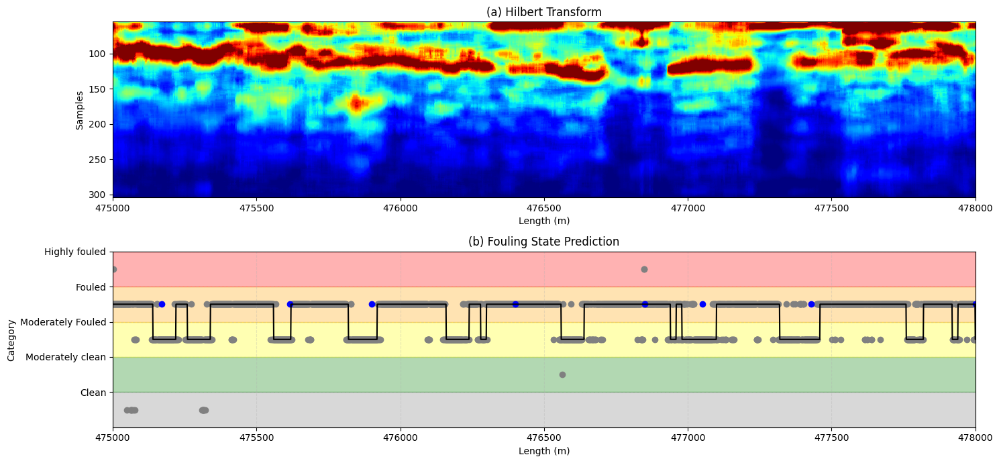

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 475000
xlim_2 = 478000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

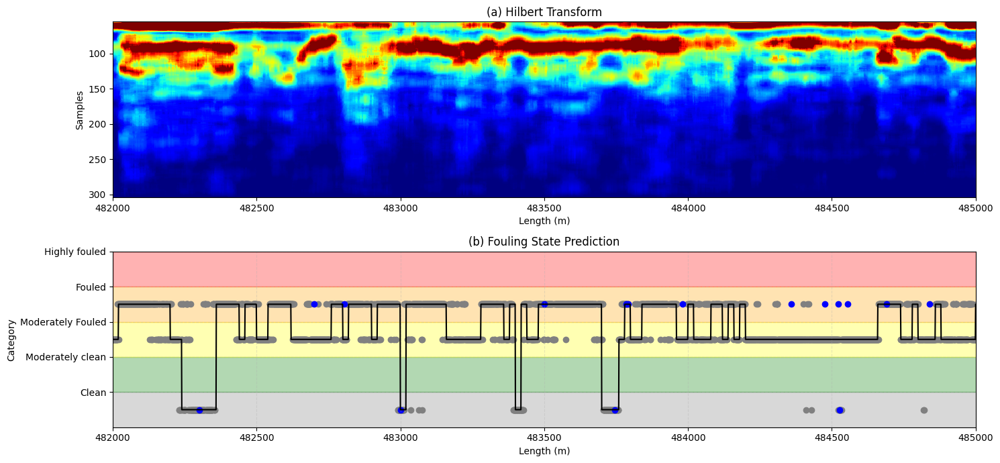

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 482000
xlim_2 = 485000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

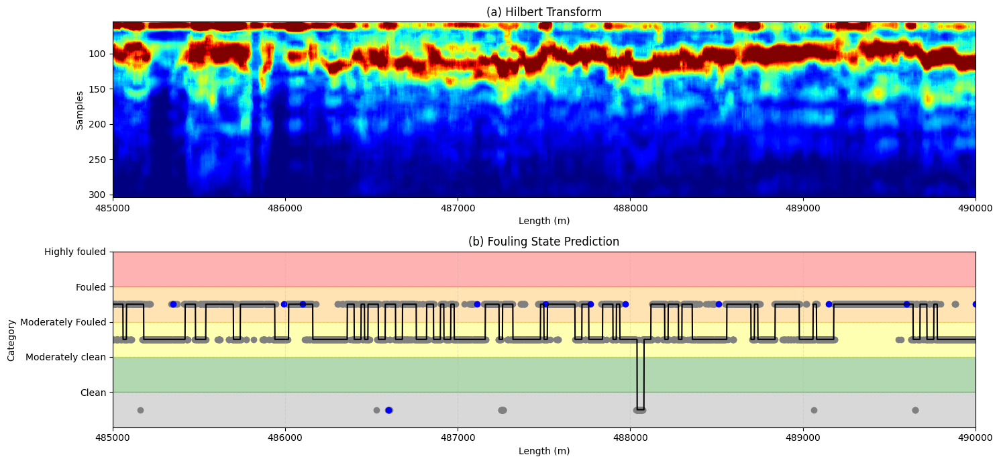

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 485000
xlim_2 = 490000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

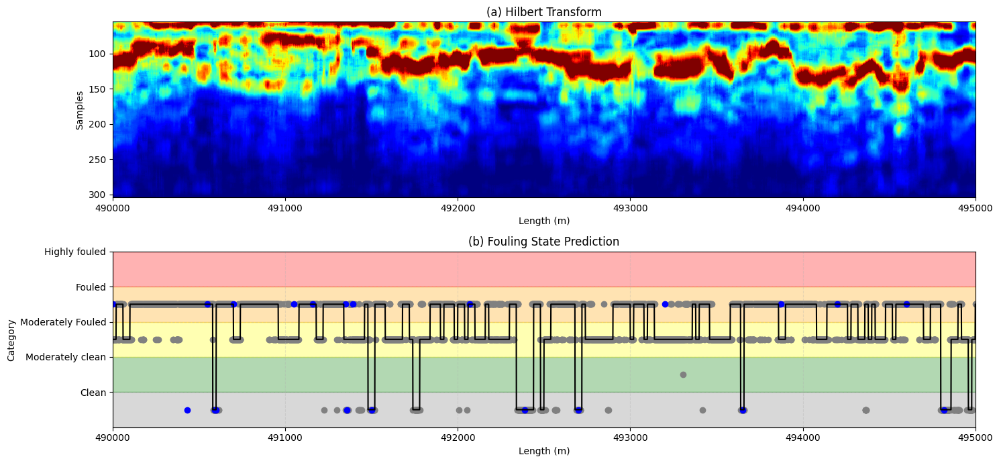

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 490000
xlim_2 = 495000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

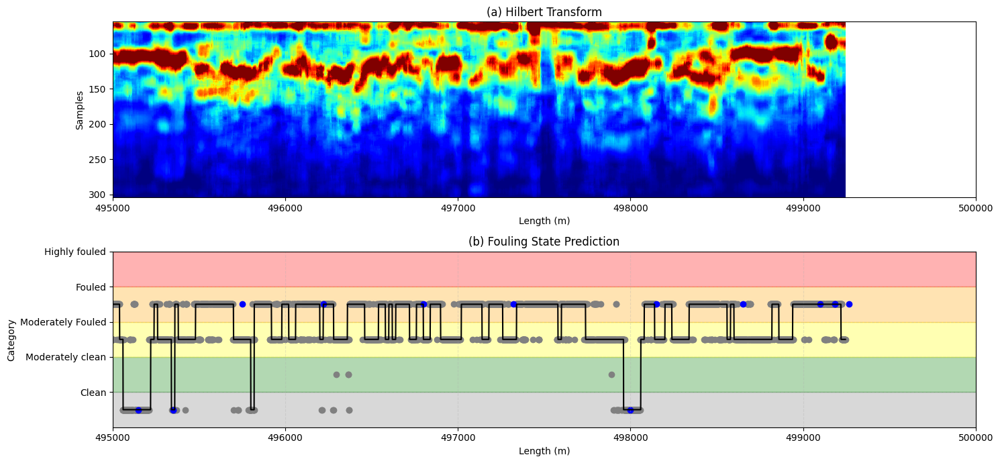

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 495000
xlim_2 = 500000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

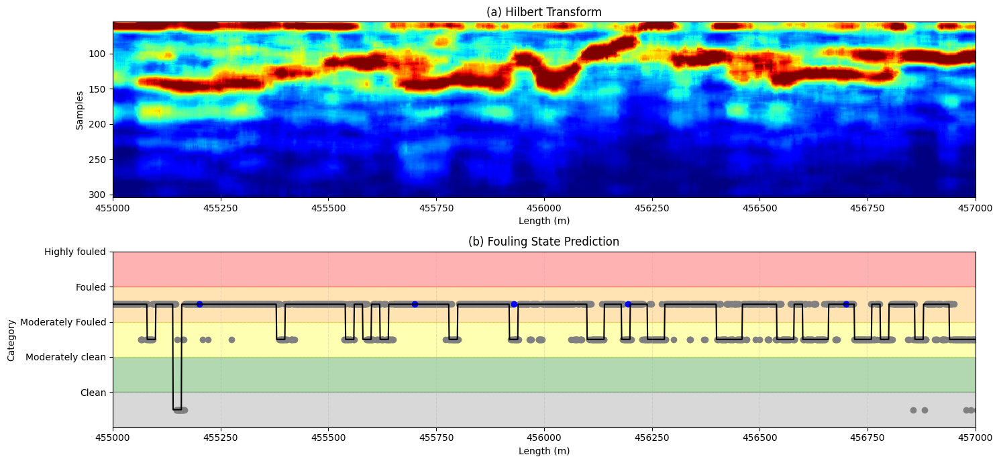

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 455000
xlim_2 = 457000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

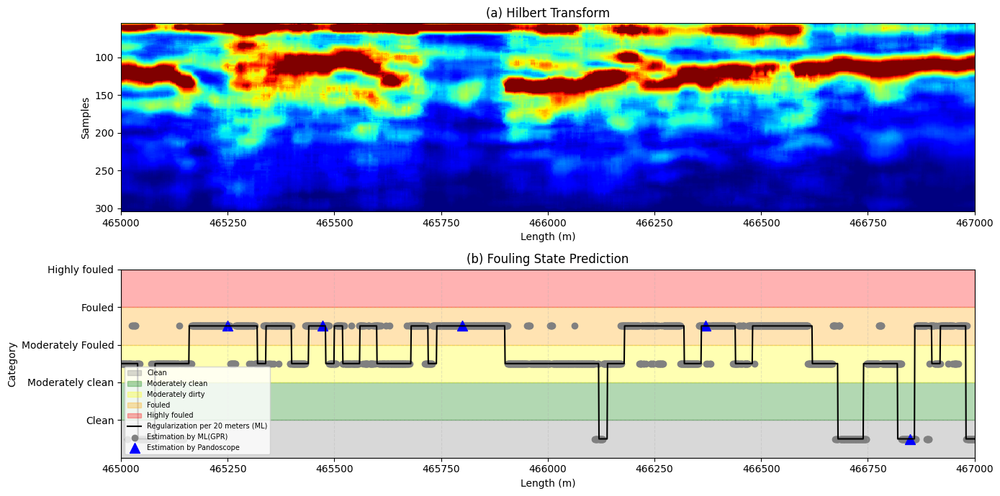

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(14, 7))

xlim_1 = 465000
xlim_2 = 467000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'], color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'], color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'], color='blue', label='Estimation by Pandoscope', marker='^', s=100)

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
axs[1].legend(loc='lower left', fontsize=7)

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

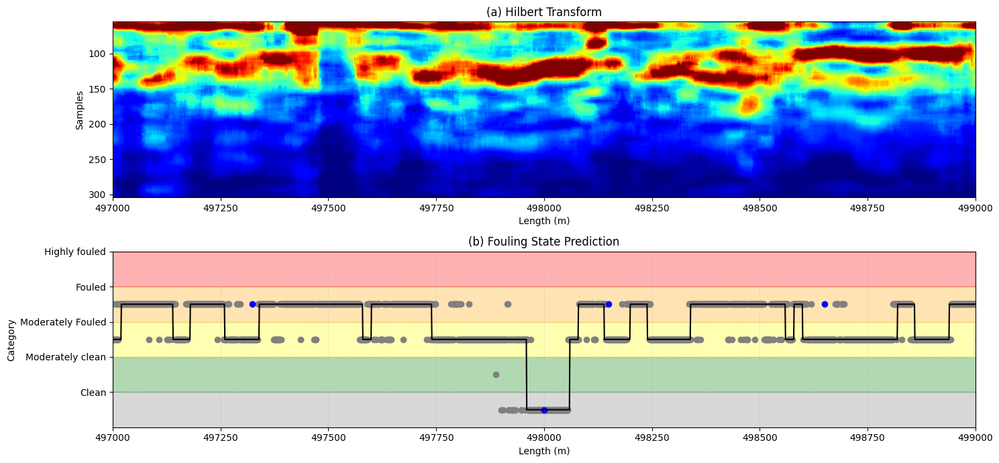

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 7))

xlim_1 = 497000
xlim_2 = 499000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk'], df_Resultados['Prediccion_Num_reg_20'],
            color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk'], df_Resultados['Prediccion_Numero'],
               color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk'], df_Pda['FI_Class'],
               color='blue', label='Estimation by Pandoscope')

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
# axs[1].legend(loc='upper left')

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()

# 5. sdfsdf

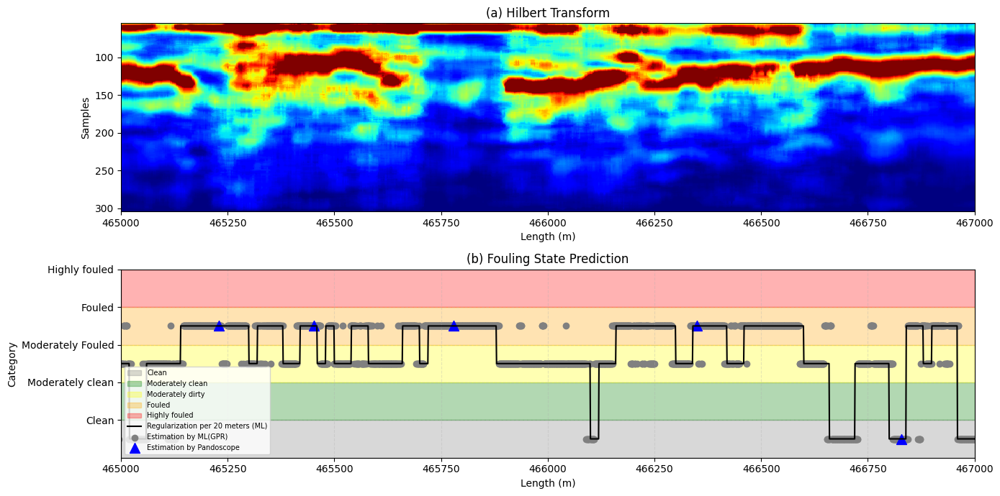

In [ ]:
# Configuración inicial
v_min = np.percentile(df_H.values, 5)
v_max = np.percentile(df_H.values, 95)

# Crear subplots (2 filas, 1 columna)
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(14, 7))

xlim_1 = 465000
xlim_2 = 467000

# Gráfico 1
cbar1 = axs[0].pcolormesh(df_H.columns, df_H.index, df_H, cmap='jet', vmin=v_min, vmax=v_max)
axs[0].invert_yaxis()
axs[0].set_xlabel("Length (m)")
axs[0].set_ylabel("Samples")
axs[0].set_xlim(xlim_1, xlim_2)
# fig.colorbar(cbar1, ax=axs[0], orientation='vertical')
axs[0].set_title("(a) Hilbert Transform")

# Gráfico 2
# Bandas de color
axs[1].axhspan(0, 1, color='gray', alpha=0.3, label='Clean')
axs[1].axhspan(1, 2, color='green', alpha=0.3, label='Moderately clean')
axs[1].axhspan(2, 3, color='yellow', alpha=0.3, label='Moderately dirty')
axs[1].axhspan(3, 4, color='orange', alpha=0.3, label='Fouled')
axs[1].axhspan(4, 5, color='red', alpha=0.3, label='Highly fouled')

# Scatter y líneas
axs[1].plot(df_Resultados['Pk']-20, df_Resultados['Prediccion_Num_reg_20'], color='black', label='Regularization per 20 meters (ML)')
axs[1].scatter(df_Resultados['Pk']-20, df_Resultados['Prediccion_Numero'], color='gray', label='Estimation by ML(GPR)')
axs[1].scatter(df_Pda['Pk']-20, df_Pda['FI_Class'], color='blue', label='Estimation by Pandoscope', marker='^', s=100)

# Etiquetas y formato del segundo gráfico
axs[1].set_xlabel("Length (m)")
axs[1].set_ylabel("Category")
axs[1].set_title("(b) Fouling State Prediction")
axs[1].set_xlim(xlim_1, xlim_2)
axs[1].set_ylim(0, 5)

# Etiquetas del eje Y
etiquetas_y = ['Clean', 'Moderately clean', 'Moderately Fouled', 'Fouled', 'Highly fouled']
axs[1].set_yticks(range(1, len(etiquetas_y) + 1))
axs[1].set_yticklabels(etiquetas_y)
axs[1].grid(True, alpha=0.3, linestyle='--')
axs[1].legend(loc='lower left', fontsize=7)

# Ajustar espacio entre subplots
fig.tight_layout()

# Mostrar el gráfico
plt.show()